In [161]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=1

import numpy as np
import sys
import os
import matplotlib.pyplot as plt
import vis_utils

sys.path.append('/gpfs01/berens/user/hzhang/eff-ph')
from utils.utils import get_path
from utils.io_utils import load_multiple_res
from utils.toydata_utils import get_toy_data
from utils.fig_utils import dataset_to_print, plot_dgm_loops, dist_to_print, plot_edges_on_scatter
from utils.pd_utils import sort_cycle

sys.path.append('/gpfs01/berens/user/hzhang/eff-ph/vis_utils')
from vis_utils.loaders import load_dataset
from vis_utils.plot import plot_scatter
from vis_utils.utils import load_dict, save_dict
from vis_utils.tsne_wrapper import TSNEwrapper
from openTSNE.affinity import Affinities

import umap
from ripser import Rips
from ripser.ripser import get_greedy_perm

from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib import collections  as mc
from matplotlib.colors import Normalize
import matplotlib.cm

from openTSNE.nearest_neighbors import PrecomputedNeighbors
from openTSNE.affinity import PerplexityBasedNN

from vis_utils.utils import kNN_graph, kNN_dists
from scipy.spatial.distance import pdist, squareform
import glasbey
import scipy.sparse
import networkx as nx

from sklearn.decomposition import PCA
from sklearn.manifold import MDS

from persim import plot_diagrams
from utils.pd_utils import get_life_times
import pandas as pd
from collections import Counter

from sklearn.decomposition import PCA
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg
import community as community_louvain
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: CUDA_VISIBLE_DEVICES=1


# load distribution

In [162]:
style_file = "utils.style"
plt.style.use(style_file)

In [163]:
distances = {
    "euclidean": [{}],
        "diffusion": [
        {"k": 15, "t": 8, "kernel": "sknn", "include_self": False},
        {"k": 100, "t": 8, "kernel": "sknn", "include_self": False},
        {"k": 15, "t": 64, "kernel": "sknn", "include_self": False},
        {"k": 100, "t": 64, "kernel": "sknn", "include_self": False},
    ],
    "eff_res": [
        {"corrected": True, "weighted": False, "k": 15, "disconnect": True},
        {"corrected": True, "weighted": False, "k": 100, "disconnect": True},
    ],
}

In [ ]:
embd_smart_purple = np.load(os.path.join(root_path, "embd_n_mask", "embd_before_procrustes", "embd_smart_purple.npy"))
embd_tasic_purple = np.load(os.path.join(root_path,  "embd_n_mask", "embd_before_procrustes","embd_tasic_purple.npy"))
embd_10x_purple = np.load(os.path.join(root_path,  "embd_n_mask", "embd_before_procrustes","embd_10x_purple_20k.npy"))

In [ ]:
root_path = get_path("data")
dist_tasic_purple = load_dict(os.path.join(root_path, "77test_dist", "dist_tasic_purple.pkl"))
dist_yao_purple = load_dict(os.path.join(root_path,"77test_dist", "dist_smart_purple.pkl"))
dist_10x_purple = load_dict(os.path.join(root_path,"77test_dist", "dist_10x_purple.pkl"))


In [168]:
def total_variation(dist_1, dist_2):
    return 0.5 * np.sum(np.abs(dist_1 - dist_2))

In [170]:
def reshape_dist(dist, num = None):
    #num: number of loops per condition
    full_dist = list(dist.keys())[1:]
    size = len(dist[list(dist.keys())[0]])
    result = np.zeros((1,size))
    ticks = []
    # shorten_dist = ['euclidean',
    #     'diffusion_k_15_t_8',
    #     'diffusion_k_100_t_8',
    #     'diffusion_k_15_t_64',
    #     'diffusion_k_100_t_64',
    #     'eff_res_k_15',
    #     'eff_res_k_100']
    shorten_dist = ['euc',
        'diff_15_8',
        'diff_100_8',
        'diff_15_64',
        'diff_100_64',
        'eff_15',
        'eff_100']
    for shorten, condition in zip(shorten_dist, full_dist):
        if num is not None:
            result = np.vstack((result, np.array(dist[condition][:int(num)])))
            ticks.extend([f"{shorten}"+f"_{i}"for i in range(num)])
        else:
            result = np.vstack((result, np.array(dist[condition])))
            ticks.extend([f"{shorten}"+f"_{i}"for i in range(7)])
    return ticks, result[1:,:]

In [171]:
ticks, reshape_tasic_purple = reshape_dist(dist_tasic_purple,7)
_, reshape_yao_purple = reshape_dist(dist_yao_purple,7)
_, reshape_10x_purple = reshape_dist(dist_10x_purple,7)


In [172]:
def complete_linkage(mat, threshold = 0.4):
    link = linkage(squareform(mat), method='complete')
    clusters = fcluster(link, t=threshold, criterion='distance')
    
    row_dendr = dendrogram(link)
    
    list_of_communities = [[] for _ in range(max(clusters))]
    for i, cluster in enumerate(clusters):
        list_of_communities[cluster-1].append(i)
    
    return clusters, list_of_communities

In [173]:
def compute_weighted_density(list, weight, cluster_template):
    #list (2*l)
    #weight (l)
    lens = len(list)
    re_weight = [w for w in weight for _ in range(2)]

    weighted_frequencies = np.zeros(len(cluster_template))
    for num, weight in zip(numbers, weights):
        weighted_frequencies[num] += weight
    return weighted_frequencies

In [174]:
def total_variation_matrix(reshaped_array1, reshaped_array2):
    size = reshaped_array1.shape[0]
    result = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            result[i][j] = total_variation(reshaped_array1[i,:], reshaped_array2[j,:])
    return result

In [175]:
def generate_figure(reshape1, reshape2, title, threshold = None, saveas = None):
    result = total_variation_matrix(reshape1, reshape2)
    values, base = np.histogram(result.flatten(), bins=100)
    cumulative = np.cumsum(values)
    fig, ax = plt.subplots(1,2, figsize=(6,3))
    fig.suptitle(title)
    ax[0].plot(base[:-1], cumulative/cumulative[-1], c='blue')
    ax[0].set_xlim([0, 1])
    ax[0].set_xlabel("Total variation")
    ax[0].set_ylabel("% of pairs of conditions")
    if threshold is not None:
        ax[0].axvline(threshold, c="red")
        result = np.where(result > threshold, threshold, result)
    
    ax1 = ax[1].imshow(result, cmap='grey')
    ax[1].set_yticks(range(len(ticks)), ticks, size='small')
    ax[1].set_xticks(range(len(ticks)), ticks, size='small', rotation=90, ha='right')
    ax[1].set_ylabel(title.split('*')[0])
    ax[1].set_xlabel(title.split('*')[-1])
    waht = fig.colorbar(ax1, ax=ax[1])
    # plt.tight_layout()
    plt.show()
    if saveas is not None:
        fig.savefig(os.path.join("/gpfs01/berens/user/hzhang/eff-ph/figures", saveas), dpi=300)
    

In [176]:
def fig_pigeonhole_loops(list_of_communities, matrix, ticks, title, threshold = None, ungroups = 1, saveas = None):
    size = len(list_of_communities)
    
    fig, ax = plt.subplots(size, 2, figsize=(4, size))
    ax[0][0].set_title("                                    loops in groups", fontsize=7)
    for i in range(size):
        loops_idx = list_of_communities[i]
        size_loops = len(loops_idx)
        submatrix = matrix[np.ix_(loops_idx, loops_idx)]
        values, base = np.histogram(submatrix.flatten(), bins=100)
        cumulative = np.cumsum(values)
        fig.suptitle(title)
        
        ax[i, 0].plot(base[:-1], cumulative/cumulative[-1], c='blue')
        ax[i, 0].set_xlim([0, 1])
        ax[i, 0].set_xlabel("Total variation")
        # ax[i, 0].set_ylabel("% of pairs of conditions")
        if threshold is not None:
            ax[i, 0].axvline(threshold[i], c="red")
            submatrix = np.where(submatrix > threshold[i], threshold[i], submatrix)
    
        ax1 = ax[i,1].imshow(submatrix, cmap='grey')
        
        ytick = [f"{a}_{np.array(ticks)[a]}"for a in loops_idx]
        ax[i,1].set_yticks(range(size_loops), ytick, size='small') #np.array(ticks)[loops_idx]
        ax[i,1].set_xticks(range(size_loops), loops_idx, size='small', rotation=90, ha='right')# np.array(ticks)[loops_idx]
        # ax[i,1].set_ylabel(title.split('*')[0])
        # ax[i,1].set_xlabel(title.split('*')[-1])
        waht = fig.colorbar(ax1, ax=ax[i, 1])
    if ungroups == 1:
        ax[size-1][0].set_title("                                    ungroupable loops", fontsize=7)
    plt.show()
    if saveas is not None:
        fig.savefig(os.path.join(get_path("figures"), saveas), dpi=300)
    

In [177]:
def pic_pigeonhole_loops(partition, ticks, dataset, embd_n_mask, xlim = None, ylim = None, saveas = None):
    if type(embd_n_mask) is tuple:
        embd_n_mask = embd_n_mask[0][embd_n_mask[1]]
    rows = len(set(partition.values()))
    columns = np.max([list(partition.values()).count(value) for value in range(rows)])
    
    width_ratios = [0.75] + [1] * (columns-1)
    fig, ax = plt.subplots(rows, columns, figsize=(columns*3, rows*3), constrained_layout=True) #, width_ratios=width_ratios
    
    distances = {
        "euclidean": [{}],
            "diffusion": [
            {"k": 15, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 15, "t": 64, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 64, "kernel": "sknn", "include_self": False},
        ],
        "eff_res": [
            {"corrected": True, "weighted": False, "k": 15, "disconnect": True},
            {"corrected": True, "weighted": False, "k": 100, "disconnect": True},
        ],
    }
    root_path = get_path("data")
    all_res = load_multiple_res(datasets=dataset, n=None, embd_dims=None, sigmas=None, distances=distances, seeds=0, root_path=root_path, n_threads=1)

    # n_exp = sum([len(all_res[distance]) for distance in distances.keys()])
    # n_cols = 8
    # mid_col = np.floor(n_cols/2)
    plot_loops = True
    colors = ['#d714fb', '#006100', '#5d0014', '#75ff3d', '#ffcef3', '#656979', '#db0c59']
    idx = 0
    pos_list = [0]*rows
    for distance in distances.keys():
        for full_dist in all_res[distance]:
            res = all_res[distance][full_dist]
            life_times_loops = get_life_times(res, dim=1)
            loop_idx_sorted = np.argsort(life_times_loops)[::-1][:7]
            for n in range(7):
                row = partition[idx]
                cax = ax[row][pos_list[row]]
                cax.set_title(idx, fontsize=7)
                if ylim is not None:
                    cax.set_ylim(*ylim)
                if xlim is not None:
                    cax.set_xlim(*xlim)
                plot_scatter(cax, embd_n_mask, y="k", s=1, alpha=1, scalebar=False)
                plot_edges_on_scatter(ax=cax,
                                 edge_idx=res["cycles"][1][loop_idx_sorted[n]],
                                 x=embd_n_mask,
                                 color=colors[n],
                                 linewidth=1)
            #we assume there's loop everywhere..........a
                pos_list[row]+=1
                idx+=1
    for axx in ax.flat:
        axx.axis('off')
    fig.suptitle(dataset, fontsize = 16)       
    plt.show()
    if saveas is not None:
        fig.savefig(os.path.join(get_path("figures"), saveas), dpi=300)

In [178]:
def turn_to_partition(list_of_communities_corrected):
    manual_partition = {num: idx for idx, sublist in enumerate(list_of_communities_corrected) for num in sublist}
    manual_partition = dict(sorted(manual_partition.items()))
    return manual_partition

In [179]:
def louvain_method(tv_matrix, resolution = None):
    tv_matrix = 1- tv_matrix
    np.fill_diagonal(tv_matrix, 0)
    # tv_matrix[tv_matrix < 0.4] = 0
    G = nx.from_numpy_array(tv_matrix)
    partition = community_louvain.best_partition(G, resolution = resolution)
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []  # Create a new list for this community
        communities[community_id].append(node)  # Add the node to the corresponding community

    list_of_communities = list(communities.values())
    return partition, list_of_communities

In [181]:
def fig_bi_pigeonhole_loops(list_of_communities, matrix, ticks, title, threshold = None, saveas = None):
    size = len(list_of_communities)
    fig_list_of_communities = list_of_communities
    # print(len(fig_list_of_communities[-1] ))
    fig_list_of_communities[-1] =  sorted(sum(fig_list_of_communities[-1], []))
    
    fig, ax = plt.subplots(size, 2, figsize=(4, size),  constrained_layout=True)
    ax[0][0].set_title("                                    loops in groups", fontsize=7)
    for i in range(size):
        loops_idx_0 = [a for a in fig_list_of_communities[i] if a <49]
        loops_idx_1 =  [a-49 for a in fig_list_of_communities[i] if a >= 49]
        submatrix = matrix[np.ix_(loops_idx_0, loops_idx_1)]
        values, base = np.histogram(submatrix.flatten(), bins=100)
        cumulative = np.cumsum(values)
        fig.suptitle(title)
        
        ax[i, 0].plot(base[:-1], cumulative/cumulative[-1], c='blue')
        ax[i, 0].set_xlim([0, 1])
        ax[i, 0].set_xlabel("Total variation")
        # ax[i, 0].set_ylabel("% of pairs of conditions")
        if threshold is not None:
            ax[i, 0].axvline(threshold[i], c="red")
            submatrix = np.where(submatrix > threshold[i], threshold[i], submatrix)
    
        ax1 = ax[i,1].imshow(submatrix, cmap='grey')
        
        ytick = [f"{a}_{np.array(ticks)[a]}"for a in loops_idx_0]
        ax[i,1].set_yticks(range(len(loops_idx_0)), ytick, size='small') #np.array(ticks)[loops_idx]
        ax[i,1].set_xticks(range(len(loops_idx_1)), [a+49 for a in loops_idx_1], size='small', rotation=90, ha='right')# np.array(ticks)[loops_idx]
        # ax[i,1].set_ylabel(title.split('*')[0])
        # ax[i,1].set_xlabel(title.split('*')[-1])
        waht = fig.colorbar(ax1, ax=ax[i, 1])
    ax[size-1][0].set_title("                                    ungroupable loops", fontsize=7)
    plt.show()
    if saveas is not None:
        fig.savefig(os.path.join("/gpfs01/berens/user/hzhang/eff-ph/figures", saveas), dpi=300)

In [182]:
def complete_linkage_mix(mat_tasic, mat_yao, mat_mix, threshold = 2.0):
    size = mat_tasic.shape[0]
    bi_mat = np.ones((2*size, 2*size))
    bi_mat[:size, size:] = mat_mix
    bi_mat[size:, :size] = mat_mix.T
    bi_mat[:size, :size] = mat_tasic
    bi_mat[size:, size:] = mat_yao
    np.fill_diagonal(bi_mat, 0)
    
    link = linkage(squareform(bi_mat), method='complete')
    clusters = fcluster(link, t=threshold, criterion='distance')
    
    row_dendr = dendrogram(link)
    # print(pd.DataFrame(link, 
    #          columns=['row label 1', 'row label 2', 'distance', 'no. of items in clust.'],
    #          index=['cluster %d' %(i+1) for i in range(link.shape[0])]))
    
    list_of_communities = [[] for _ in range(max(clusters))]
    for i, cluster in enumerate(clusters):
        list_of_communities[cluster-1].append(i)
    
    
    trim_list_of_communities = []
    waste = []
    for lst in list_of_communities:
        if any(x <49 for x in lst) and any(x >= 49 for x in lst):
            trim_list_of_communities.append(lst)
        else:
            waste.append(lst)
    trim_list_of_communities.append(waste)
    
    partition = {}
    part_trim_list_of_communities = trim_list_of_communities[:-1] + trim_list_of_communities[-1]
    for index, lst in enumerate(part_trim_list_of_communities):
        if isinstance(lst, list):
            for number in lst:
                partition[number] = index  
        else:
            partition[lst] = index
    
    return partition, trim_list_of_communities

In [183]:
def pic_bi_pigeonhole_loops(partition, ticks, dataset_tasic, dataset_yao, cell_group, xlim = None, ylim = None, saveas = None):
    rows = len(set(partition.values()))
    columns = np.max([list(partition.values()).count(value) for value in range(rows)])
    
    # width_ratios = [0.75] + [1] * (columns-1)
    fig, ax = plt.subplots(rows, columns, figsize=(columns*3, rows*3), constrained_layout=True) #, width_ratios=width_ratios
    
    distances = {
        "euclidean": [{}],
            "diffusion": [
            {"k": 15, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 15, "t": 64, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 64, "kernel": "sknn", "include_self": False},
        ],
        "eff_res": [
            {"corrected": True, "weighted": False, "k": 15, "disconnect": True},
            {"corrected": True, "weighted": False, "k": 100, "disconnect": True},
        ],
    }
    root_path = get_path("data")
    all_res_tasic = load_multiple_res(datasets=dataset_tasic, n=None, embd_dims=None, sigmas=None, distances=distances, seeds=0, root_path=root_path, n_threads=1)
    all_res_yao = load_multiple_res(datasets=dataset_yao, n=None, embd_dims=None, sigmas=None, distances=distances, seeds=0, root_path=root_path, n_threads=1)

    plot_loops = True
    colors = ['#d714fb', '#006100', '#5d0014', '#75ff3d', '#ffcef3', '#656979', '#db0c59']
    idx = 0
    pos_list = [0]*rows
    for _ in range(2):
        for distance in distances.keys():
            for full_dist in all_res_tasic[distance]:
                if idx<49:
                    # cax.set_ylim((10,80))
                    embd = embd_tasic
                    res = all_res_tasic[distance][full_dist]
                    life_times_loops = get_life_times(res, dim=1)
                    loop_idx_sorted = np.argsort(life_times_loops)[::-1][:7]
                    if cell_group == "orange":
                        mask = tasic_mask_orange
                    elif cell_group == "purple":
                        mask = tasic_mask_purple
                else:
                    # cax.set_xlim((-85,0))
                    embd = embd_yao
                    res = all_res_yao[distance][full_dist]
                    life_times_loops = get_life_times(res, dim=1)
                    loop_idx_sorted = np.argsort(life_times_loops)[::-1][:7]
                    if cell_group == "orange":
                        mask = smart_mask_orange
                    elif cell_group == "purple":
                        mask = smart_mask_purple
                
                for n in range(7):
                    row = partition[idx]
                    cax = ax[row][pos_list[row]]
                    cax.set_title(idx, fontsize=7)
                    if cell_group == "orange":
                        if idx<49:
                            cax.set_ylim((30,80))
                        else:
                            cax.set_xlim((-85,0))
                            cax.set_ylim((-30,30))
                            
                    elif cell_group == "purple":
                        if idx<49:
                            cax.set_ylim((-40,40))
                        else:
                            # cax.set_xlim((-85,0))
                            cax.set_ylim((0,80))
                    plot_scatter(cax, embd[mask], y="k", s=1, alpha=1, scalebar=False)
                    plot_edges_on_scatter(ax=cax,
                                        edge_idx=res["cycles"][1][loop_idx_sorted[n]],
                                        x=embd[mask],
                                        color=colors[n],
                                        linewidth=1)
                    pos_list[row]+=1
                    idx+=1
    for axx in ax.flat:
        axx.axis('off')
    ax[10][0].set_title("                                    ungroupable loops", fontsize=30)
    fig.suptitle(cell_group, fontsize = 16)       
    plt.show()
    if saveas is not None:
        fig.savefig(os.path.join(get_path("figures"), saveas), dpi=300)

In [184]:
#this works a bit but not much......ONLY for multipl datasets!!!!
def tune_bi_threshold(lower_b = 0.5, higher_b = 0.9):
    ts = np.arange(lower_b, higher_b, 0.01)
    ave_tv = np.zeros((ts.shape))
    n_tv = np.zeros((ts.shape))
    size = 49
    bi_mat = np.ones((2*size, 2*size))
    bi_mat[:size, size:] = mat_mix
    bi_mat[size:, :size] = mat_mix.T
    bi_mat[:size, :size] = mat_tasic
    bi_mat[size:, size:] = mat_yao
    np.fill_diagonal(bi_mat, 0)
    
    for i, t in enumerate(ts):
        partition, trim_list_of_communities = complete_linkage_mix(mat_tasic, mat_yao, mat_mix, threshold = t)
        tvs = []
        for l in trim_list_of_communities[:-1]:
            l_tasic = [a for a in l if a <49]
            l_yao = [b for b in l if b >=49]
            
            tvs = tvs + [bi_mat[a,b] for a in l_tasic  for b in l_yao]
        ave_tv[i] = np.mean(np.array(tvs))
        n_tv[i] = len(tvs)
    return ave_tv, n_tv

# 4. Tasic purple * Tasic purple

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

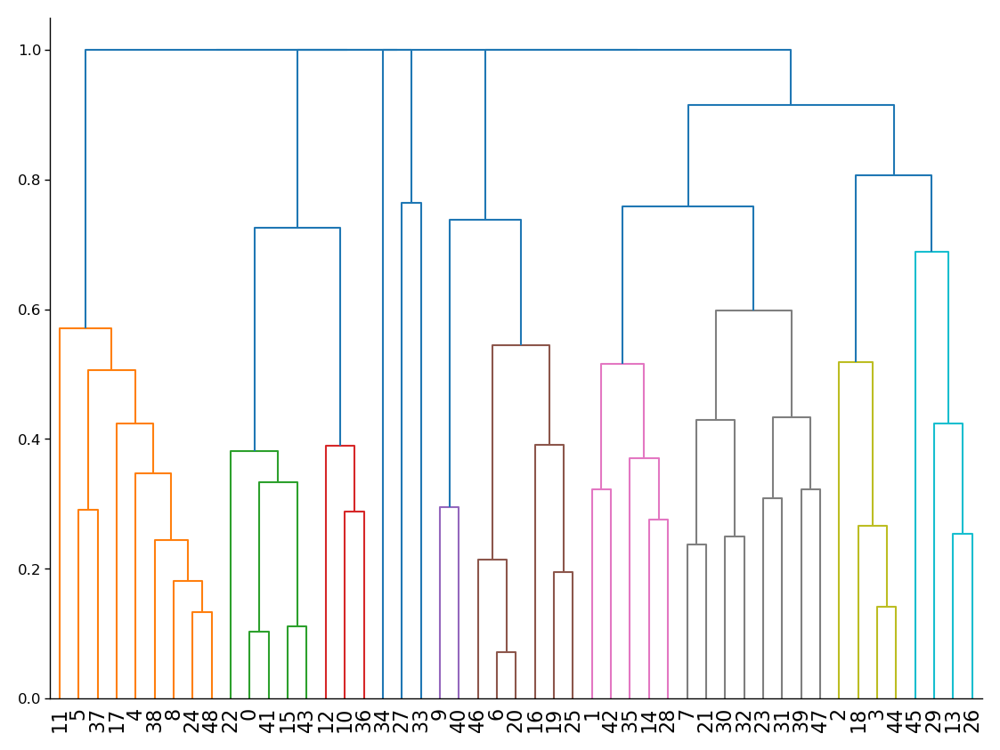

In [274]:
mat = total_variation_matrix(reshape_tasic_purple, reshape_tasic_purple)
clusters, list_of_communities = complete_linkage(mat, threshold =0.8)
partition = turn_to_partition(list_of_communities)


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

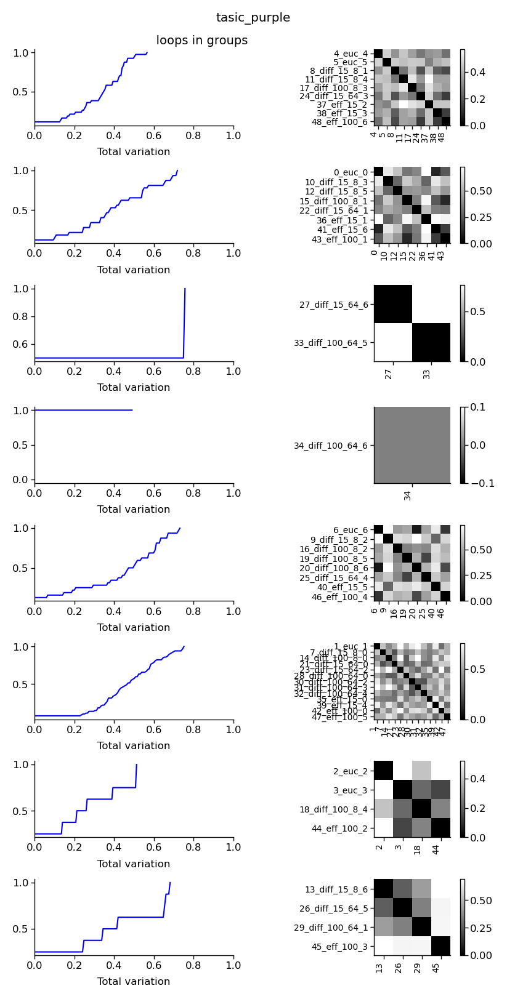

In [275]:
fig_pigeonhole_loops(list_of_communities, mat, ticks, title = "tasic_purple", threshold = None, ungroups = None, saveas = None)

Done with tasic_purple_lamp5 None euclidean n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

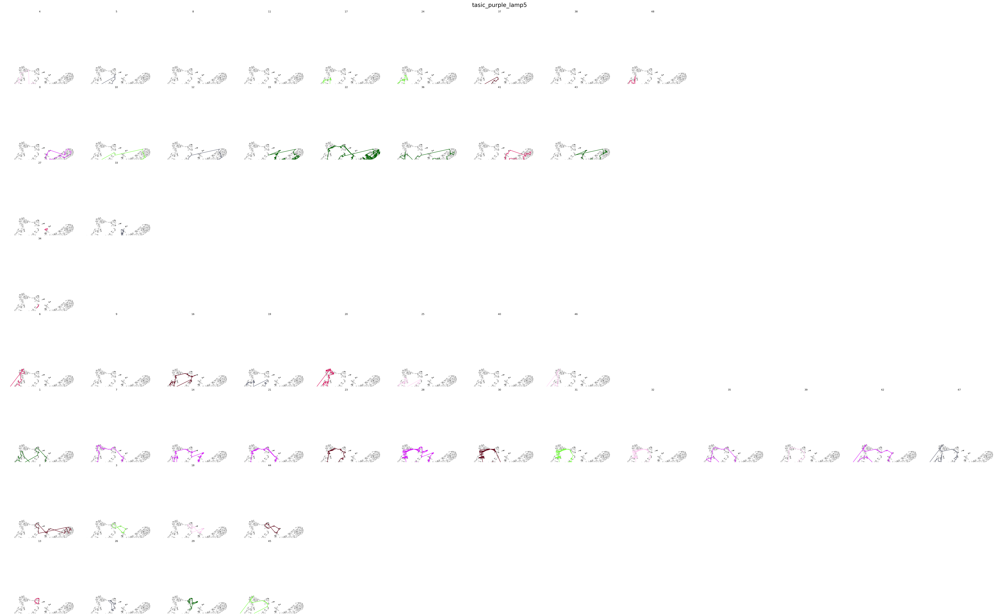

In [278]:
pic_pigeonhole_loops(partition, ticks, "tasic_purple_lamp5", (embd_tasic, tasic_mask_purple), xlim = None, ylim = (10, 80), saveas = None)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

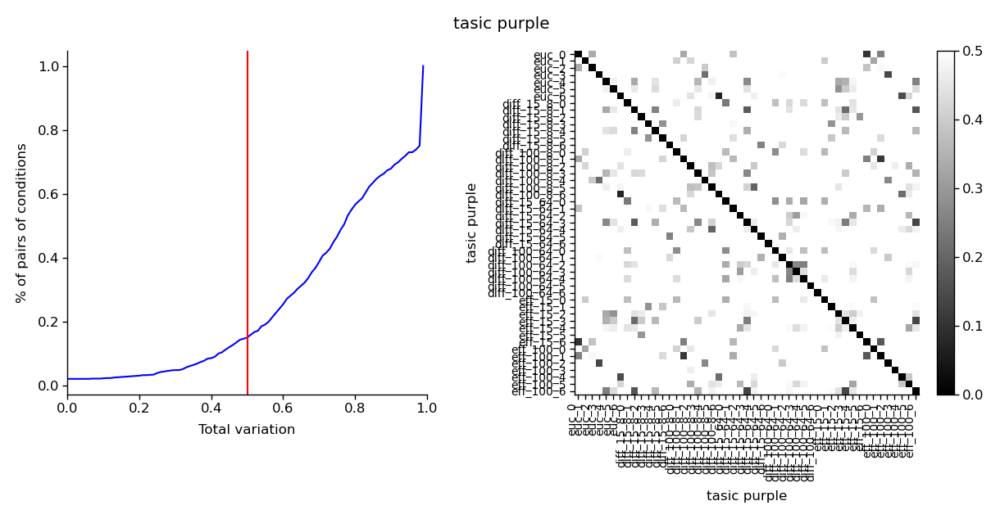

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [448]:
generate_figure(reshape_tasic_purple, reshape_tasic_purple, "tasic purple", 0.5, saveas = "tv_tasic_purple.png")


## manual

In [450]:
matrix = total_variation_matrix(reshape_tasic_purple, reshape_tasic_purple)


In [466]:
partition, list_of_communities = louvain_method(matrix, resolution = 1.5)

In [467]:
list_of_communities

[[0, 2, 10, 12, 15, 22, 27, 33, 41, 43],
 [1, 42],
 [3, 13, 18, 23, 26, 29, 34, 44, 45],
 [4, 5, 8, 9, 11, 17, 24, 37, 38, 40, 48],
 [6, 16, 19, 20, 25, 46, 47],
 [7, 14, 21, 28, 35],
 [30, 31, 32],
 [36],
 [39]]

In [495]:
list_of_communities_corrected = [[10, 12,36],[0, 15, 41,43],
 [7, 14, 21, 28, 30, 32, 35, 42, ], [16, 23, 31, 45, 47],[6,20, 46],
 [3, 18, 26, 29, 44],[8, 17, 24, 38,48],
 [4, 5, 9, 11, 19, 25, 37, 39, 40], [1, 2, 13, 22,  27, 33, 34]]

In [496]:
corrected_partition = turn_to_partition(list_of_communities_corrected)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

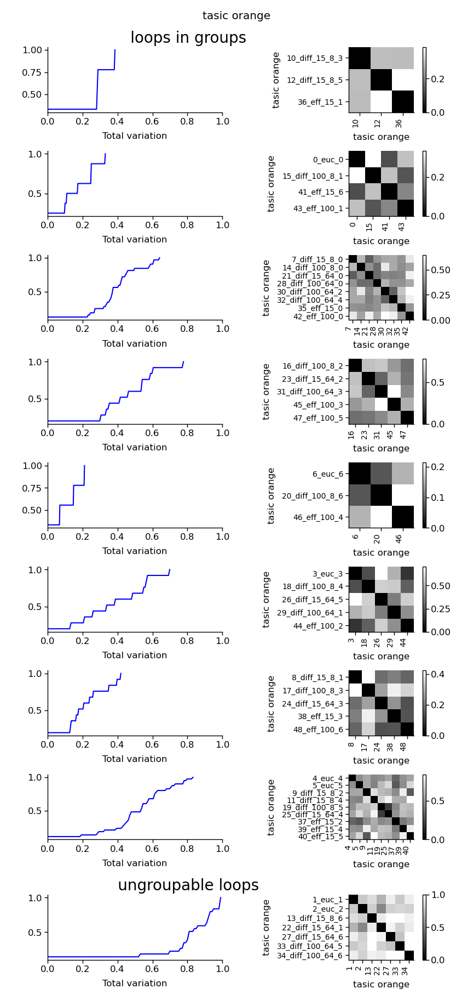

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [498]:
fig_pigeonhole_loops(list_of_communities_corrected, matrix, ticks, title = "tasic orange", threshold = None, saveas = "gtv_tasic_purple.png")

Done with tasic_purple_lamp5 None euclidean n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

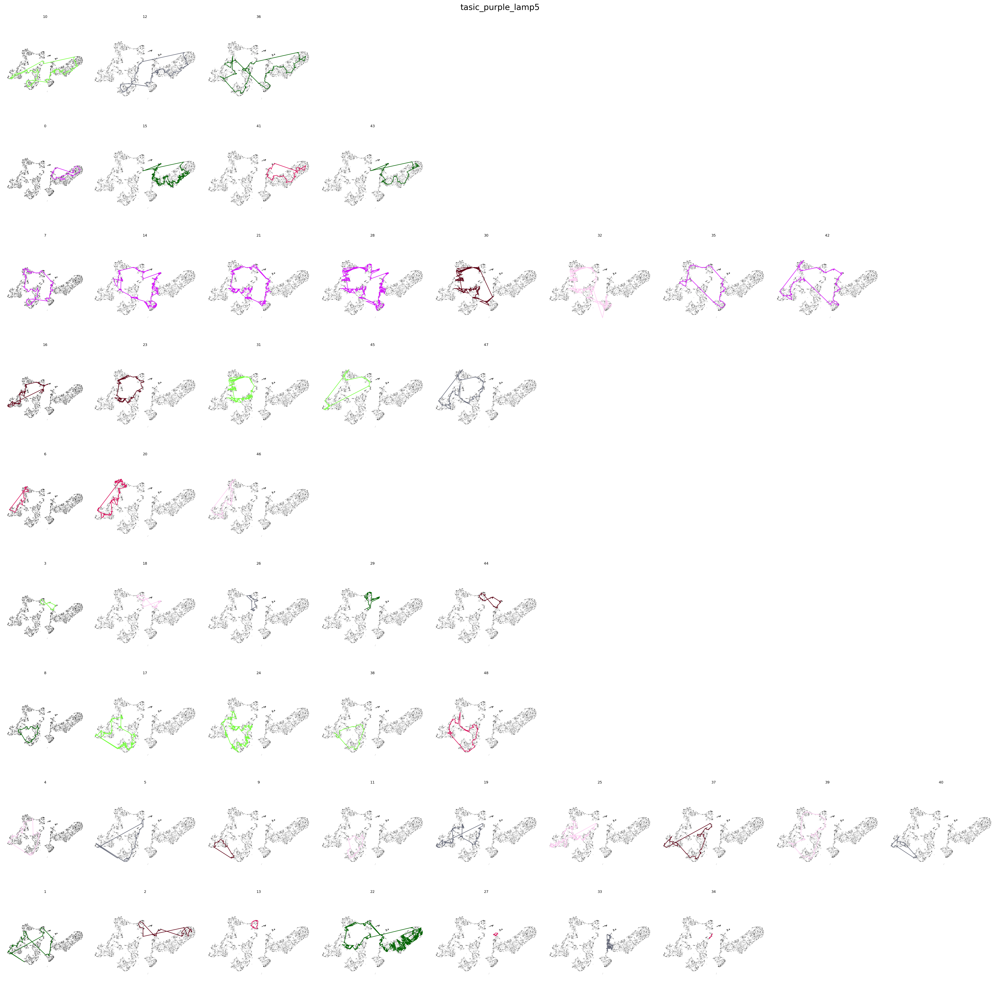

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [499]:
pic_pigeonhole_loops(corrected_partition, ticks, "tasic_purple_lamp5", embd_tasic, tasic_mask_purple, saveas = "gtvp_tasic_purple.png")

# 5. Yao purple * Yao purple

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

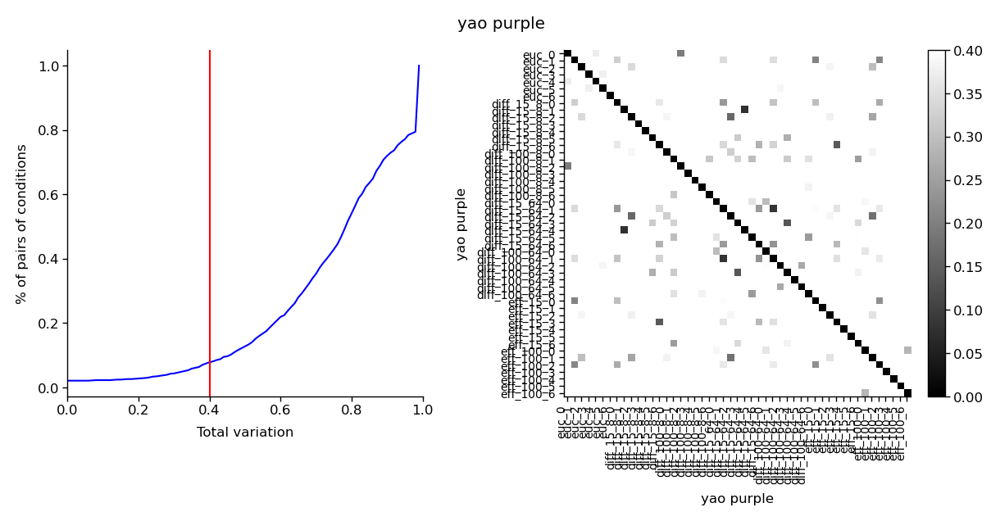

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [500]:
generate_figure(reshape_yao_purple, reshape_yao_purple, "yao purple", 0.4, saveas = "tv_yao_purple.png")

In [502]:
matrix = total_variation_matrix(reshape_yao_purple, reshape_yao_purple)


In [513]:
partition, list_of_communities = louvain_method(matrix, resolution = 1.4)


In [514]:
list_of_communities

[[0, 4, 8, 16, 18, 25, 40, 46],
 [1, 7, 10, 13, 17, 22, 27, 29, 32, 35, 38, 39, 44],
 [2, 9, 11, 14, 23, 28, 37, 43],
 [3, 5, 30, 33],
 [6, 12, 15, 19, 20, 24, 26, 31, 34, 36, 41, 45, 47, 48],
 [21],
 [42]]

In [534]:
list_of_communities_corrected = [[0, 4, 16],[8, 18, 25, 40, 46],
 [1, 7, 10, 13, 17, 22, 27, 29, 35, 38, 39, 44],
 [2, 9, 11, 14, 23, 28, 37, 43],
 [3, 5, 30, 33], [24, 31],
 [6, 12, 15, 19, 20, 21, 26, 32, 34, 36, 41, 42, 45, 47, 48]]


In [535]:
corrected_partition = turn_to_partition(list_of_communities_corrected)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

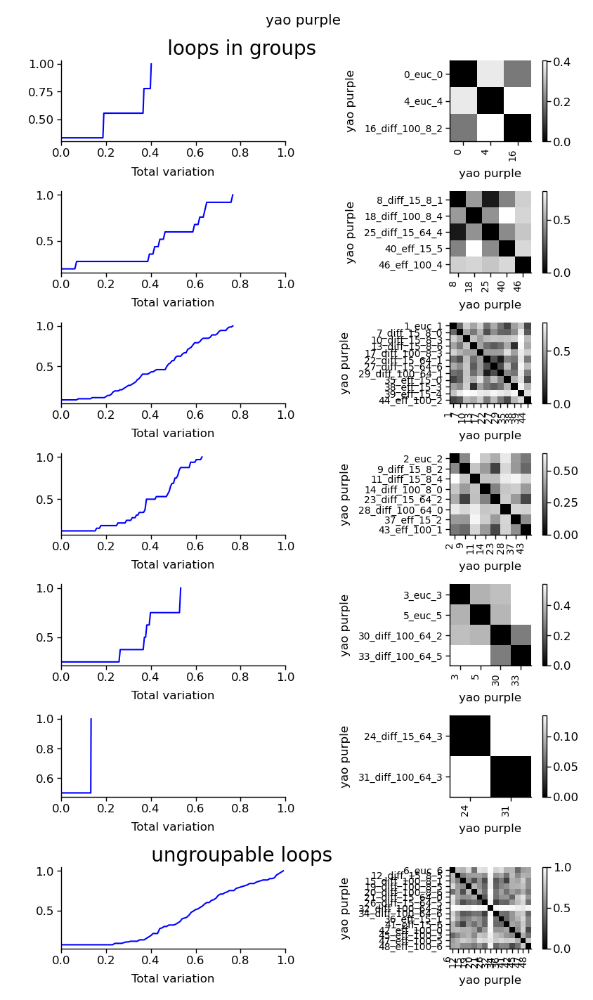

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [536]:
fig_pigeonhole_loops(list_of_communities_corrected, matrix, ticks, title = "yao purple", threshold = None, saveas = "gtv_yao_smart_purple.png")

Done with yao_smart_purple None euclidean n_outliers=0, perturbation=None
Done with yao_smart_purple None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_smart_purple None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_smart_purple None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_smart_purple None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_smart_purple None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_smart_purple None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

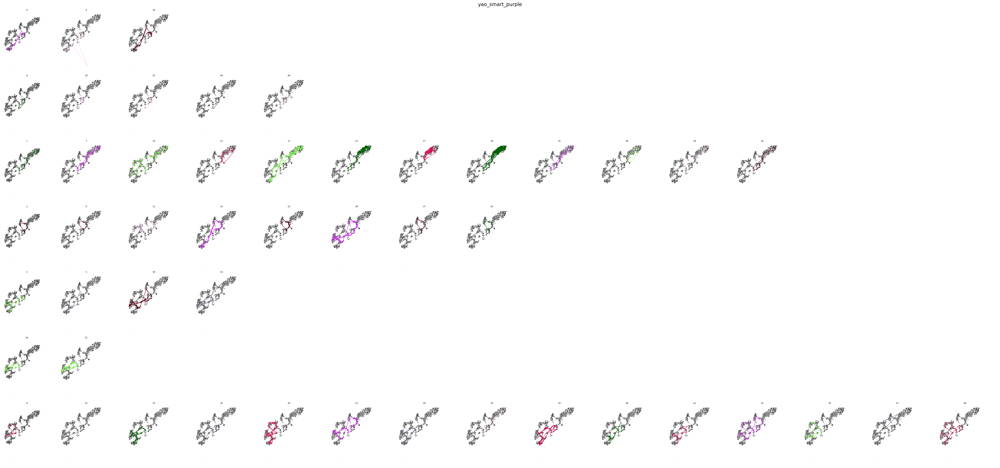

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [538]:
pic_pigeonhole_loops(corrected_partition, ticks, "yao_smart_purple", embd_yao, smart_mask_purple, saveas = "gtvg_yao_smart_purple.png")

# 6. Tasic Purple * Yao Purple

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

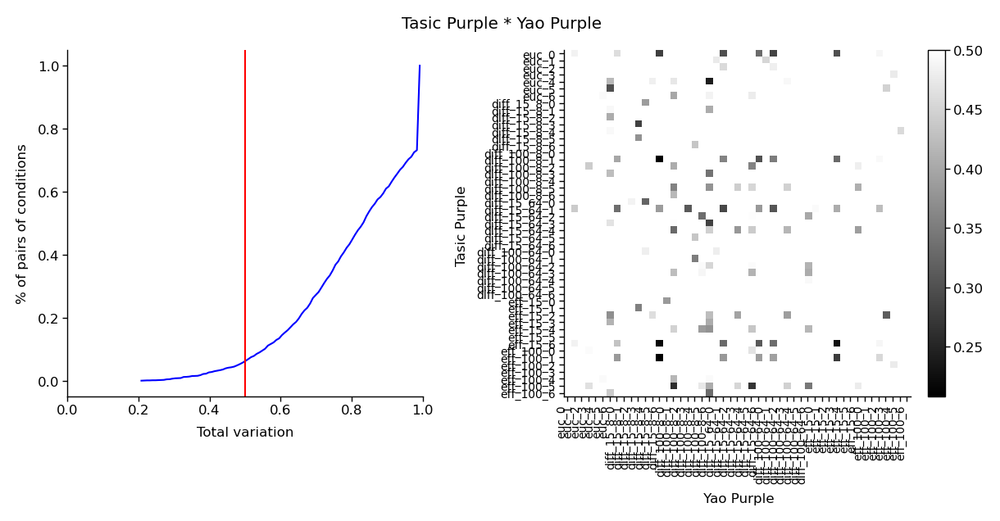

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [791]:
generate_figure(reshape_tasic_purple, reshape_yao_purple, "Tasic Purple * Yao Purple", 0.5, saveas = "tv_tasic_yao_purple.png")

In [39]:
mat_mix = total_variation_matrix(reshape_tasic_purple, reshape_yao_purple)
mat_tasic = total_variation_matrix(reshape_tasic_purple, reshape_tasic_purple)
mat_yao = total_variation_matrix(reshape_yao_purple, reshape_yao_purple)


In [40]:
ave_tv, n_tv

(array([0.33513369, 0.34821955, 0.3721706 , 0.38110271, 0.39090096,
        0.39090096, 0.39090096, 0.39090096, 0.40611631, 0.4080016 ,
        0.41282127, 0.41282127, 0.41282127, 0.41282127, 0.41282127,
        0.41282127, 0.41282127, 0.41282127, 0.44691661, 0.44691661,
        0.44691661, 0.44691661, 0.44691661, 0.44691661, 0.46136287,
        0.46136287, 0.51138461, 0.51138461, 0.51138461, 0.52969486,
        0.53666923, 0.53666923, 0.53666923, 0.54493026, 0.54493026,
        0.55765911, 0.55765911, 0.55765911, 0.59968002, 0.59968002]),
 array([ 41.,  45.,  63.,  73.,  84.,  84.,  84.,  84.,  93.,  94.,  97.,
         97.,  97.,  97.,  97.,  97.,  97.,  97., 131., 131., 131., 131.,
        131., 131., 143., 143., 208., 208., 208., 237., 247., 247., 247.,
        259., 259., 295., 295., 295., 366., 366.]))

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

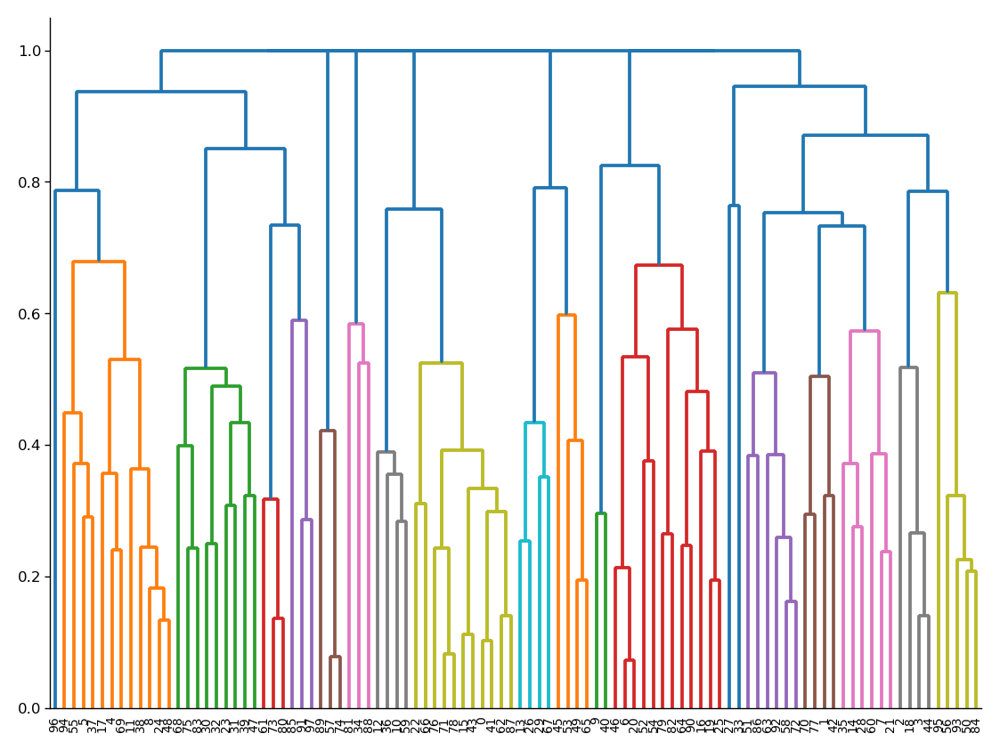

In [28]:
ave_tv, n_tv = tune_bi_threshold()

In [ ]:
ave_tv, n_tv 

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

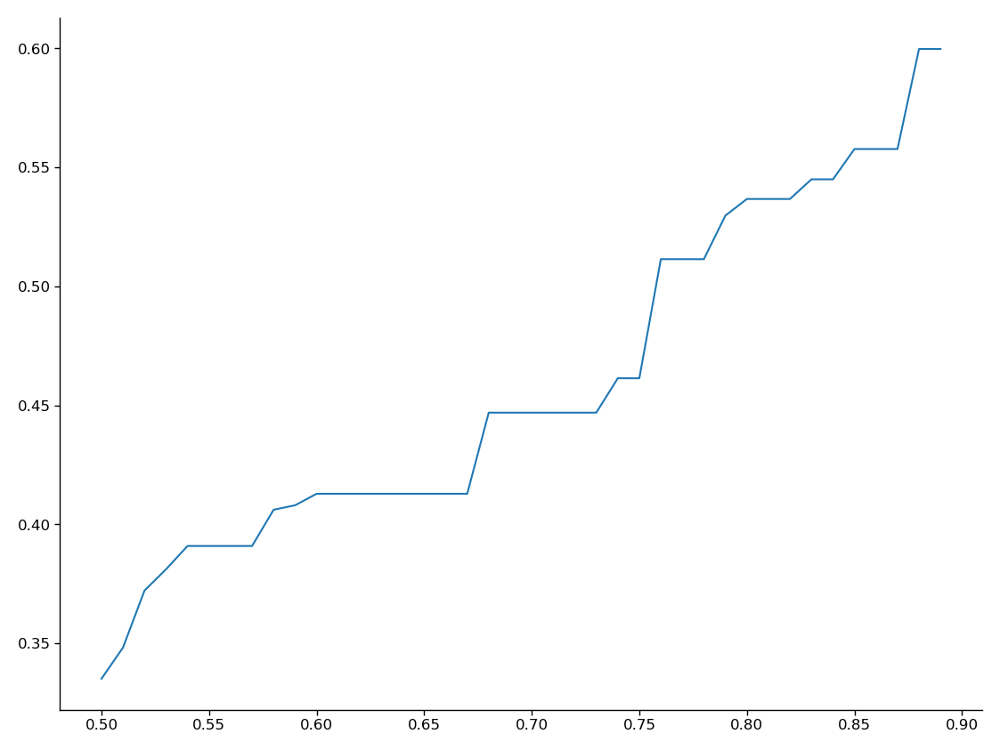

In [171]:
# plt.plot(np.arange(0, len(ave_tv), 1), ave_tv)
plt.plot(np.arange(0.5, 0.9, 0.01), ave_tv)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

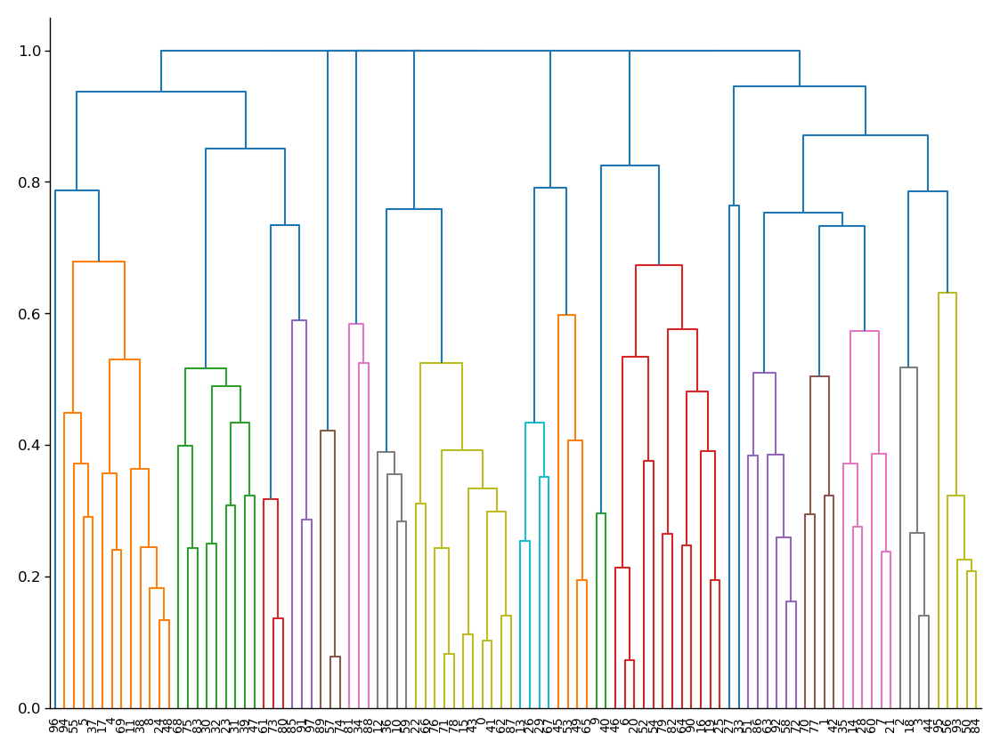

In [42]:
partition, trim_list_of_communities = complete_linkage_mix(mat_tasic, mat_yao, mat_mix, threshold = 0.75)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

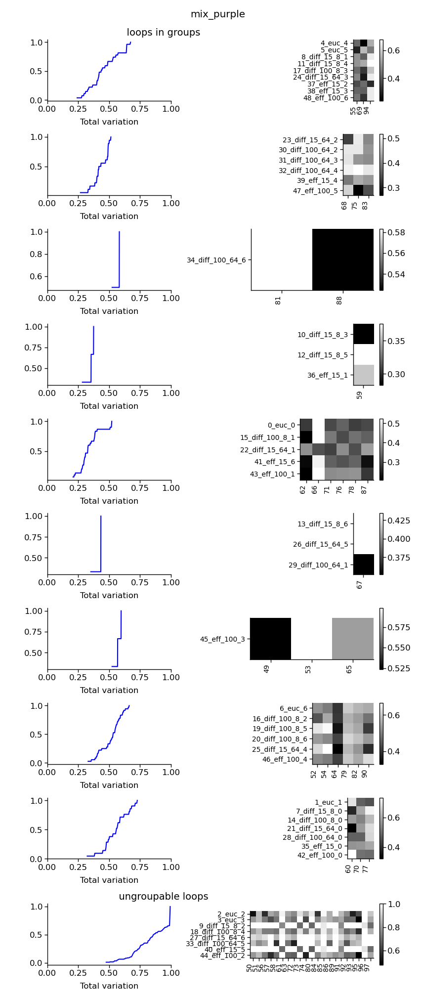

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [43]:
fig_bi_pigeonhole_loops(trim_list_of_communities, mat_mix, ticks, "mix_purple", threshold = None, saveas = "linkage_mix_purple_fig.png")


In [51]:
pic_bi_pigeonhole_loops(partition, ticks,  "tasic_purple_lamp5",  "yao_smart_purple", "purple", xlim = None, ylim = None, saveas = "linkage_mix_purple_pic.png") #"linkage_orange_mix.png"

Done with tasic_purple_lamp5 None euclidean n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with tasic_purple_lamp5 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_smart_purple None euclidean n_outliers=0, perturbation=None
Done with yao_smart_purple None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_sma

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because